# **Import Library**

Pada bagian ini, kita akan mengimpor berbagai pustaka (libraries) yang diperlukan untuk melakukan analisis data, pemrosesan data, serta pembuatan dan evaluasi model clustering menggunakan algoritma K-Means.

In [124]:
# Mengimpor pustaka yang dibutuhkan untuk analisis data
import pandas as pd  # Untuk manipulasi dan analisis data
from sklearn.cluster import KMeans  # Algoritma KMeans untuk clustering
from sklearn.preprocessing import MinMaxScaler  # Untuk normalisasi data
from sklearn.preprocessing import LabelEncoder  # Untuk encoding variabel kategorikal
import matplotlib.pyplot as plt  # Untuk visualisasi data dan hasil model
import seaborn as sns  # Untuk visualisasi data yang lebih menarik
import numpy as np  # Untuk manipulasi array dan operasi numerik
%matplotlib inline


*   pandas digunakan untuk manipulasi dan analisis data seperti membaca file CSV dan memanipulasi DataFrame
*   KMeans digunakan untuk melakukan clustering dengan algoritma K-Means.
*   MinMaxScaler digunakan untuk melakukan normalisasi fitur agar berada dalam rentang yang konsisten.
*   LabelEncoder digunakan untuk mengonversi variabel kategorikal menjadi format numerik.
*   matplotlib dan seaborn digunakan untuk visualisasi hasil analisis dan model, serta mempermudah eksplorasi data.
*   numpy digunakan untuk operasi matematis dan array.





# **Pengumpulan Data**

In [125]:
# Membaca dataset dari file CSV
df = pd.read_csv('barang_keluar.csv', delimiter=';', skiprows=0, low_memory=False)

# Menampilkan beberapa baris pertama dari dataset untuk memeriksa apakah data berhasil dimuat
df.head()


,kode_barang,nama_barang,jumlah_transaksi,total_penjualan,rata_rata
0,2 TANG BLACK TEA 1 RENCENG (ISI 10),2 TANG BLACK TEA 1 RENCENG (ISI 10),1,1,1.0000
1,2 TANG MELATI 1 RENCENG (ISI 10),2 TANG MELATI 1 RENCENG (ISI 10),1,1,1.0000
2,AQUA 1500 ML 1 DUS,AQUA 1500 ML 1 DUS,10,11,1.1000
3,RIBUT KILOAN,RIBUT KILOAN,77,83,1.0779
4,7916248823,MINYAK TAWON FF,8,9,1.1250


Statistik deskriptif

In [126]:
# Memeriksa informasi dataset (tipe data, jumlah baris, dll.)
df.info()

# Menampilkan statistik deskriptif untuk memeriksa distribusi data numerik
df.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7403 entries, 0 to 7402
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   kode_barang       7403 non-null   object 
 1   nama_barang       7373 non-null   object 
 2   jumlah_transaksi  7403 non-null   int64  
 3   total_penjualan   7403 non-null   int64  
 4   rata_rata         7403 non-null   float64
dtypes: float64(1), int64(2), object(2)
memory usage: 289.3+ KB


,jumlah_transaksi,total_penjualan,rata_rata
count,7403.000000,7403.000000,7403.000000
mean,37.554640,58.901932,1.442445
std,134.103564,270.367066,4.778477
min,1.000000,1.000000,1.000000
25%,4.000000,5.000000,1.000000
50%,11.000000,12.000000,1.033300
75%,31.000000,38.000000,1.230800
max,6457.000000,10363.000000,180.000000


# **Pra Proses Data (Selection)**

Memilih Kolom yang Relevan

In [127]:
# Memilih kolom yang relevan untuk clustering
df_selected = df[['jumlah_transaksi', 'total_penjualan']]

# Menampilkan 5 baris pertama dari data yang sudah diseleksi
df_selected.head()


,jumlah_transaksi,total_penjualan
0,1,1
1,1,1
2,10,11
3,77,83
4,8,9


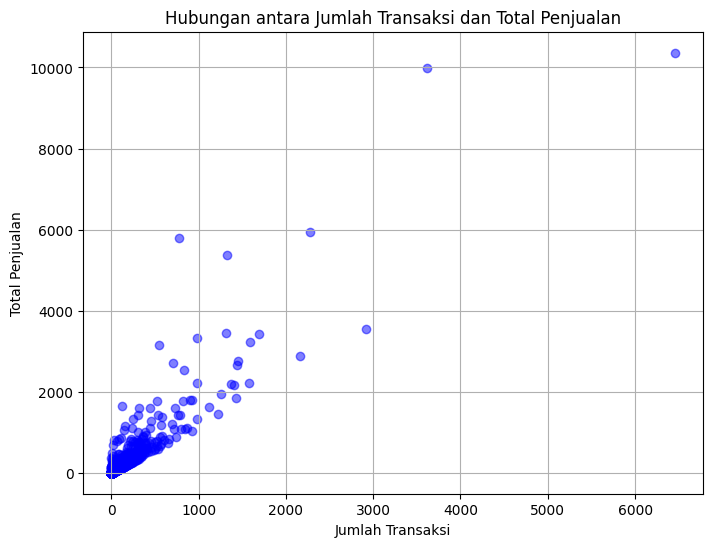

In [128]:
# Visualisasi hubungan antara jumlah_transaksi dan total_penjualan
plt.figure(figsize=(8, 6))
plt.scatter(df_selected['jumlah_transaksi'], df_selected['total_penjualan'], c='blue', alpha=0.5)
plt.title('Hubungan antara Jumlah Transaksi dan Total Penjualan')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.grid(True)
plt.show()


# **Pra Proses Data (Cleansing)**

 Memeriksa Nilai yang Hilang

In [129]:
# Memeriksa jumlah nilai yang hilang (NaN) dalam setiap kolom
print("Missing values:\n", df.isnull().sum())

# Memeriksa persentase nilai yang hilang
print("\nPercentage of Missing Values:\n", df.isnull().mean() * 100)


Missing values:
 kode_barang          0
nama_barang         30
jumlah_transaksi     0
total_penjualan      0
rata_rata            0
dtype: int64

Percentage of Missing Values:
 kode_barang         0.000000
nama_barang         0.405241
jumlah_transaksi    0.000000
total_penjualan     0.000000
rata_rata           0.000000
dtype: float64


Menangani Nilai yang Hilang (Missing Values)

In [130]:
# Menghapus baris yang mengandung nilai kosong (NaN)
df_cleaned = df.dropna()

# Memeriksa apakah nilai kosong sudah hilang setelah pembersihan
print("\nMissing values after cleaning:\n", df_cleaned.isnull().sum())



Missing values after cleaning:
 kode_barang         0
nama_barang         0
jumlah_transaksi    0
total_penjualan     0
rata_rata           0
dtype: int64


Menangani Duplikat

In [131]:
# Memeriksa jumlah duplikat dalam dataset
print("\nJumlah duplikat:", df_cleaned.duplicated().sum())

# Menghapus duplikat
df_cleaned = df_cleaned.drop_duplicates()

# Memeriksa ulang apakah duplikat sudah dihapus
print("\nJumlah duplikat setelah pembersihan:", df_cleaned.duplicated().sum())



Jumlah duplikat: 0

Jumlah duplikat setelah pembersihan: 0


Memeriksa dan Menangani Outliers

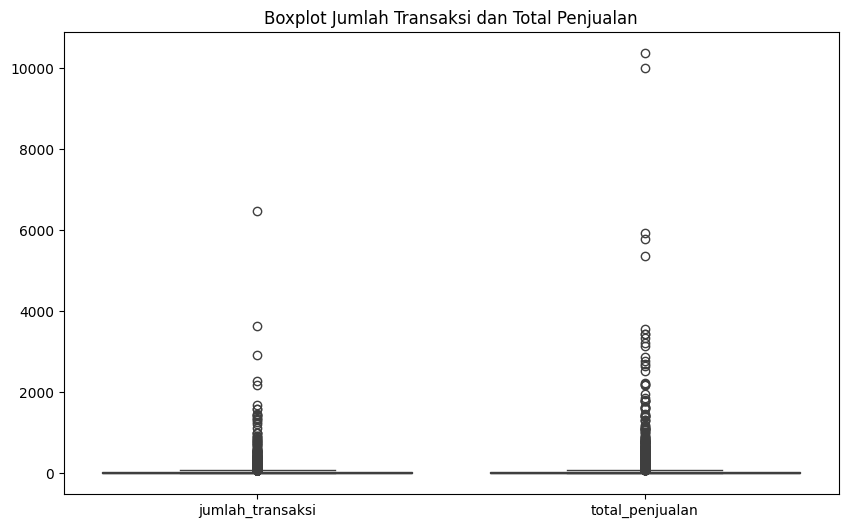

In [132]:
# Visualisasi menggunakan boxplot untuk memeriksa outliers pada kolom 'jumlah_transaksi' dan 'total_penjualan'
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_cleaned[['jumlah_transaksi', 'total_penjualan']])
plt.title('Boxplot Jumlah Transaksi dan Total Penjualan')
plt.show()


# **Pra Proses Data (Transform)**

Normalisasi Data (Scaling)

In [133]:
# Inisialisasi objek MinMaxScaler untuk normalisasi data
scaler = MinMaxScaler()

# Menormalkan kolom 'total_penjualan' dengan MinMaxScaler
df['total_penjualan_cluster'] = scaler.fit_transform(df[['total_penjualan']])

# Menormalkan kolom 'jumlah_transaksi' dengan MinMaxScaler
df['jumlah_transaksi_cluster'] = scaler.fit_transform(df[['jumlah_transaksi']])

# Jika ada fitur lain yang perlu dinormalisasi (misalnya 'rata_rata')
# df['rata_rata_cluster'] = scaler.fit_transform(df[['rata_rata']])

# Tampilkan beberapa data pertama setelah normalisasi
df.head()

,kode_barang,nama_barang,jumlah_transaksi,total_penjualan,rata_rata,total_penjualan_cluster,jumlah_transaksi_cluster
0,2 TANG BLACK TEA 1 RENCENG (ISI 10),2 TANG BLACK TEA 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000
1,2 TANG MELATI 1 RENCENG (ISI 10),2 TANG MELATI 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000
2,AQUA 1500 ML 1 DUS,AQUA 1500 ML 1 DUS,10,11,1.1000,0.000965,0.001394
3,RIBUT KILOAN,RIBUT KILOAN,77,83,1.0779,0.007914,0.011772
4,7916248823,MINYAK TAWON FF,8,9,1.1250,0.000772,0.001084


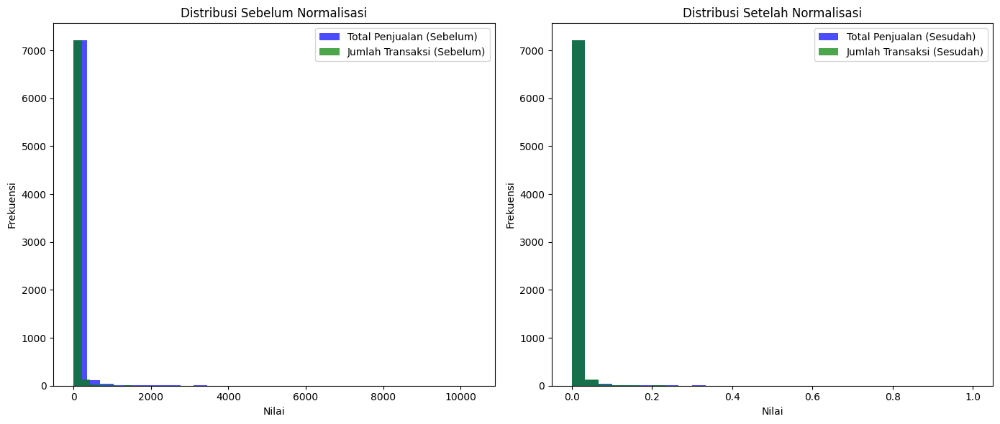

In [134]:
# Visualisasi distribusi data sebelum dan sesudah normalisasi
plt.figure(figsize=(14, 6))

# Distribusi sebelum normalisasi
plt.subplot(1, 2, 1)
plt.hist(df['total_penjualan'], bins=30, color='blue', alpha=0.7, label='Total Penjualan (Sebelum)')
plt.hist(df['jumlah_transaksi'], bins=30, color='green', alpha=0.7, label='Jumlah Transaksi (Sebelum)')
plt.title('Distribusi Sebelum Normalisasi')
plt.xlabel('Nilai')
plt.ylabel('Frekuensi')
plt.legend()

# Distribusi setelah normalisasi
plt.subplot(1, 2, 2)
plt.hist(df['total_penjualan_cluster'], bins=30, color='blue', alpha=0.7, label='Total Penjualan (Sesudah)')
plt.hist(df['jumlah_transaksi_cluster'], bins=30, color='green', alpha=0.7, label='Jumlah Transaksi (Sesudah)')
plt.title('Distribusi Setelah Normalisasi')
plt.xlabel('Nilai')
plt.ylabel('Frekuensi')
plt.legend()

plt.tight_layout()
plt.show()


In [135]:
# Menyaring kolom yang akan digunakan dalam analisis
df_scaled = df_cleaned[['jumlah_transaksi', 'total_penjualan']]

# Menggunakan MinMaxScaler untuk menormalisasi data
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_scaled)

# Menampilkan hasil transformasi (scaled values)
print("Data setelah normalisasi:\n", df_scaled[:5])  # Menampilkan 5 baris pertama dari data yang sudah dinormalisasi


Data setelah normalisasi:
 [[0.         0.        ]
 [0.         0.        ]
 [0.00139405 0.00096506]
 [0.011772   0.00791353]
 [0.00108426 0.00077205]]


Encoding Kategorikal Data (Label Encoding)

In [136]:
# Menggunakan LabelEncoder untuk mengubah kolom kategorikal menjadi numerik
encoder = LabelEncoder()
df_cleaned['kode_barang_encoded'] = encoder.fit_transform(df_cleaned['kode_barang'])

# Menampilkan 5 baris pertama untuk melihat hasil encoding
print("\nData setelah Label Encoding:\n", df_cleaned[['kode_barang', 'kode_barang_encoded']].head())



Data setelah Label Encoding:
                              kode_barang  kode_barang_encoded
0  2 TANG  BLACK TEA 1 RENCENG  (ISI 10)                   24
1      2 TANG  MELATI 1 RENCENG (ISI 10)                   25
2                     AQUA 1500 ML 1 DUS                 6335
3                           RIBUT KILOAN                    0
4                             7916248823                  485


Menggabungkan Data yang Ditransformasi

In [137]:
# Menggabungkan data yang sudah di-normalisasi dengan data yang sudah di-encode
df_transformed = pd.DataFrame(df_scaled, columns=['jumlah_transaksi_scaled', 'total_penjualan_scaled'])
df_transformed['kode_barang_encoded'] = df_cleaned['kode_barang_encoded']

# Menampilkan hasil akhir setelah transformasi
print("\nData setelah transformasi:\n", df_transformed.head())



Data setelah transformasi:
    jumlah_transaksi_scaled  total_penjualan_scaled  kode_barang_encoded
0                 0.000000                0.000000                 24.0
1                 0.000000                0.000000                 25.0
2                 0.001394                0.000965               6335.0
3                 0.011772                0.007914                  0.0
4                 0.001084                0.000772                485.0


# **Modelling Clustering**

In [138]:
km = KMeans(n_clusters=3)
km

KMeans(n_clusters=3)

Clusters ada 3 :
1. Data Penjualan Rendah
2. Data Penjualan Sedang
3. Data Penjualan Tinggi

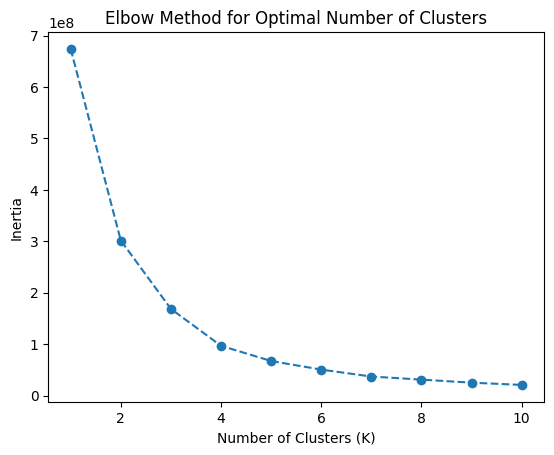

In [139]:
# Menentukan jumlah cluster optimal menggunakan Elbow Method
inertia = []
for k in range(1, 11):  # Menguji cluster antara 1 hingga 10
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(df[['jumlah_transaksi', 'total_penjualan']])
    inertia.append(km.inertia_)

# Plot Elbow Method
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.show()


In [140]:
from sklearn.metrics import silhouette_score

inertia = []
silhouette_scores = []
for k in range(2, 11):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(df_scaled)
    inertia.append(km.inertia_)
    silhouette_scores.append(silhouette_score(df_scaled, km.labels_))


Text(0, 0.5, 'Inertia')

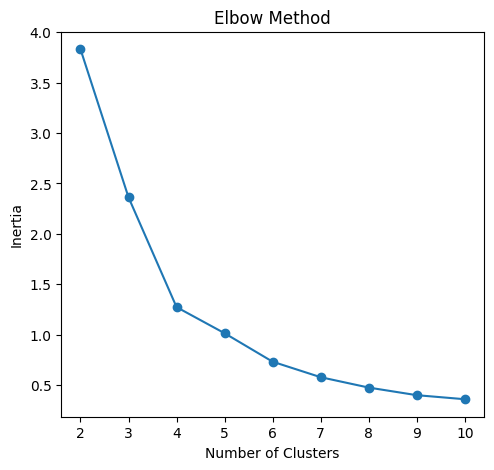

In [141]:
# Plot Elbow Method dan Silhouette Score
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(2, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

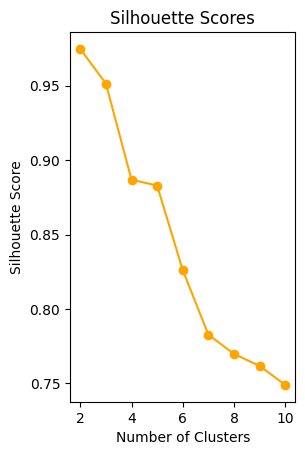

In [142]:
plt.subplot(1, 2, 2)
plt.plot(range(2, 11), silhouette_scores, marker='o', color='orange')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

# **Hasil Clustering**

In [143]:
optimal_k = silhouette_scores.index(max(silhouette_scores)) + 2  # Menambahkan 2 karena dimulai dari 2
km = KMeans(n_clusters=optimal_k, random_state=42)
y_predicted = km.fit_predict(df[['jumlah_transaksi', 'total_penjualan']])

# Menampilkan hasil cluster yang diprediksi
print("Cluster yang diprediksi untuk setiap data:\n", y_predicted[:10])  # Menampilkan 10 data pertama

Cluster yang diprediksi untuk setiap data:
 [0 0 0 0 0 0 0 0 0 0]


In [144]:
# Melakukan K-Means Clustering dengan jumlah cluster K=3
km = KMeans(n_clusters=3, random_state=42)
y_predicted = km.fit_predict(df[['jumlah_transaksi', 'total_penjualan']])

# Menampilkan hasil cluster yang diprediksi
print("Cluster yang diprediksi untuk setiap data:\n", y_predicted[:10])  # Menampilkan 10 data pertama


Cluster yang diprediksi untuk setiap data:
 [0 0 0 0 0 0 0 0 0 0]


Menambahkan Hasil Prediksi Cluster ke Data

In [145]:
y_predicted = km.fit_predict(df[['jumlah_transaksi','total_penjualan']])
y_predicted

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [146]:
# Menambahkan hasil prediksi cluster ke dataframe
df['cluster'] = y_predicted

# Menampilkan 5 baris pertama untuk memastikan kolom 'cluster' ditambahkan dengan benar
print("Data dengan kolom cluster:\n", df.head())


Data dengan kolom cluster:
                              kode_barang  \
0  2 TANG  BLACK TEA 1 RENCENG  (ISI 10)   
1      2 TANG  MELATI 1 RENCENG (ISI 10)   
2                     AQUA 1500 ML 1 DUS   
3                           RIBUT KILOAN   
4                             7916248823   

                             nama_barang  jumlah_transaksi  total_penjualan  \
0  2 TANG  BLACK TEA 1 RENCENG  (ISI 10)                 1                1   
1      2 TANG  MELATI 1 RENCENG (ISI 10)                 1                1   
2                     AQUA 1500 ML 1 DUS                10               11   
3                           RIBUT KILOAN                77               83   
4                        MINYAK TAWON FF                 8                9   

   rata_rata  total_penjualan_cluster  jumlah_transaksi_cluster  cluster  
0     1.0000                 0.000000                  0.000000        0  
1     1.0000                 0.000000                  0.000000        0  
2     1

In [147]:
# Menampilkan distribusi jumlah data pada setiap cluster
cluster_distribution = df['cluster'].value_counts()
print("\nDistribusi jumlah data pada setiap cluster:\n", cluster_distribution)



Distribusi jumlah data pada setiap cluster:
 cluster
0    7344
2      54
1       5
Name: count, dtype: int64


In [148]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Inisialisasi model K-Means dengan jumlah cluster (n_clusters) = 3
km = KMeans(n_clusters=3, random_state=42, init='k-means++', max_iter=300, n_init=10)

# Melakukan clustering pada kolom 'jumlah_transaksi' dan 'total_penjualan'
y_predicted = km.fit_predict(df[['jumlah_transaksi', 'total_penjualan']])

# Menambahkan hasil prediksi cluster ke dalam dataset
df['cluster'] = y_predicted

# Evaluasi menggunakan Silhouette Score untuk melihat kualitas clustering
silhouette_avg = silhouette_score(df[['jumlah_transaksi', 'total_penjualan']], y_predicted)

# Menampilkan hasil clustering dan evaluasi
print(f"Hasil Prediksi Cluster: {y_predicted[:10]}")  # Menampilkan 10 hasil pertama
print(f"Silhouette Score: {silhouette_avg:.3f}")     # Menampilkan Silhouette Score
df.head()


Hasil Prediksi Cluster: [0 0 0 0 0 0 0 0 0 0]
Silhouette Score: 0.954


,kode_barang,nama_barang,jumlah_transaksi,total_penjualan,rata_rata,total_penjualan_cluster,jumlah_transaksi_cluster,cluster
0,2 TANG BLACK TEA 1 RENCENG (ISI 10),2 TANG BLACK TEA 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000,0
1,2 TANG MELATI 1 RENCENG (ISI 10),2 TANG MELATI 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000,0
2,AQUA 1500 ML 1 DUS,AQUA 1500 ML 1 DUS,10,11,1.1000,0.000965,0.001394,0
3,RIBUT KILOAN,RIBUT KILOAN,77,83,1.0779,0.007914,0.011772,0
4,7916248823,MINYAK TAWON FF,8,9,1.1250,0.000772,0.001084,0


# **Visualisasi Hasil Clustering**

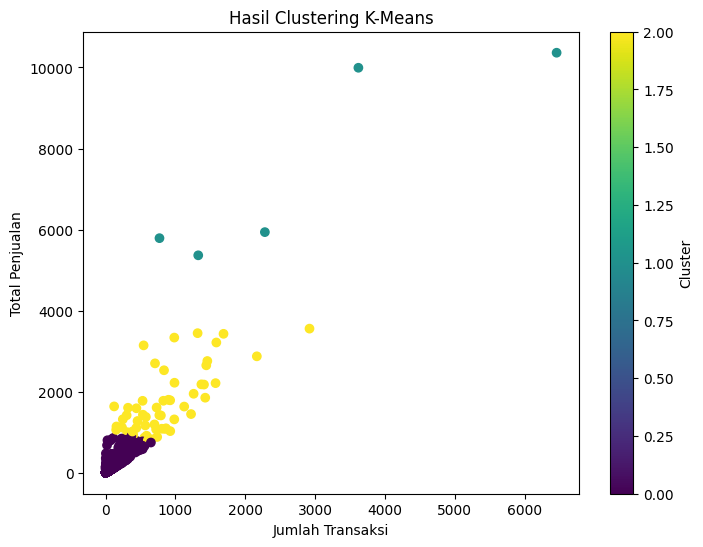

In [149]:
# Visualisasi hasil clustering
plt.figure(figsize=(8,6))
plt.scatter(df['jumlah_transaksi'], df['total_penjualan'], c=df['cluster'], cmap='viridis')
plt.title('Hasil Clustering K-Means')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.show()


In [150]:
# Memisahkan data berdasarkan cluster
df1 = df[df.cluster == 0]  # Cluster 0
df2 = df[df.cluster == 1]  # Cluster 1
df3 = df[df.cluster == 2]  # Cluster 2
# df4 = df[df.cluster == 3]  # Cluster 3, jika ada lebih dari 3 cluster


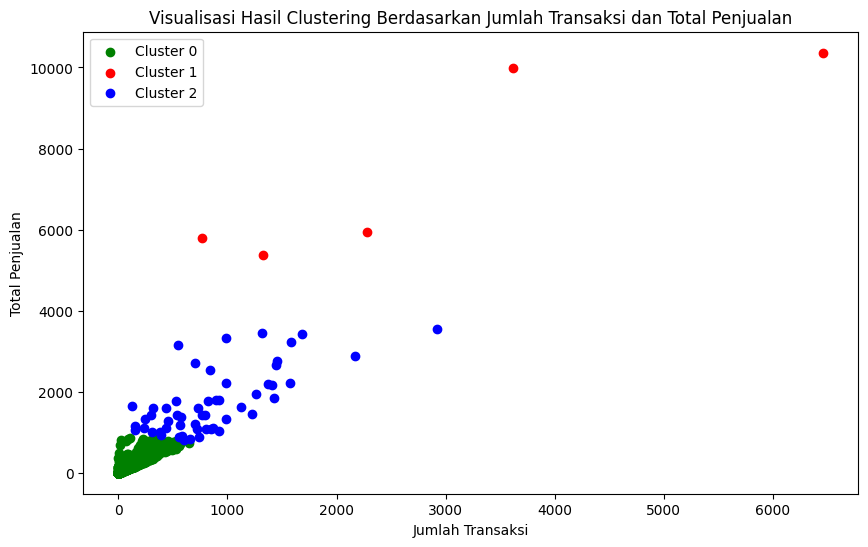

In [151]:
# Visualisasi hasil clustering dengan scatter plot
plt.figure(figsize=(10, 6))

# Plot untuk Cluster 0 (warna hijau)
plt.scatter(df1['jumlah_transaksi'], df1['total_penjualan'], color='green', label='Cluster 0')

# Plot untuk Cluster 1 (warna merah)
plt.scatter(df2['jumlah_transaksi'], df2['total_penjualan'], color='red', label='Cluster 1')

# Plot untuk Cluster 2 (warna biru)
plt.scatter(df3['jumlah_transaksi'], df3['total_penjualan'], color='blue', label='Cluster 2')

# Jika ada cluster 4, aktifkan kode berikut
# plt.scatter(df4['jumlah_transaksi'], df4['total_penjualan'], color='gray', label='Cluster 3')

# Menambahkan label dan judul pada plot
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.title('Visualisasi Hasil Clustering Berdasarkan Jumlah Transaksi dan Total Penjualan')

# Menambahkan legend untuk setiap cluster
plt.legend()

# Menampilkan plot
plt.show()


Menampilkan Centroid dari Setiap Cluster

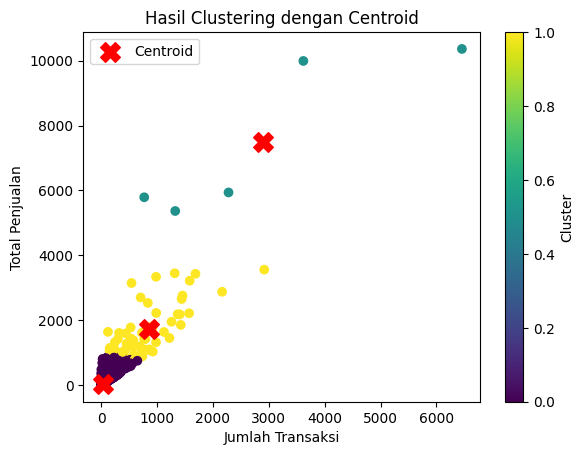

In [152]:
# Menampilkan posisi centroid
centroids = km.cluster_centers_

# Visualisasi centroid
plt.scatter(df['jumlah_transaksi'], df['total_penjualan'], c=df['cluster'], cmap='viridis')
plt.scatter(centroids[:, 0], centroids[:, 1], s=200, c='red', marker='X', label='Centroid')
plt.title('Hasil Clustering dengan Centroid')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()


In [153]:
# Analisis statistik dari tiap cluster
cluster_analysis = df.groupby('cluster').agg({
    'jumlah_transaksi': ['mean', 'std', 'min', 'max'],
    'total_penjualan': ['mean', 'std', 'min', 'max']
})

print("\nAnalisis Statistik Tiap Cluster:\n", cluster_analysis)



Analisis Statistik Tiap Cluster:
         jumlah_transaksi                         total_penjualan               \
                    mean          std  min   max            mean          std   
cluster                                                                         
0              29.611247    52.846584    1   648       41.578159    87.006382   
1            2890.600000  2267.337932  771  6457     7489.000000  2466.696475   
2             853.685185   530.482971  122  2919     1726.962963   785.017677   

                      
          min    max  
cluster               
0           1    904  
1        5365  10363  
2         805   3556  


# **Centroid Clustering**

In [154]:
km.cluster_centers_

array([[  29.61124728,   41.57815904],
       [2890.6       , 7489.        ],
       [ 853.68518519, 1726.96296296]])

Pusat Cluster (Centroids):

   Jumlah Transaksi  Total Penjualan
0         29.611247        41.578159
1       2890.600000      7489.000000
2        853.685185      1726.962963


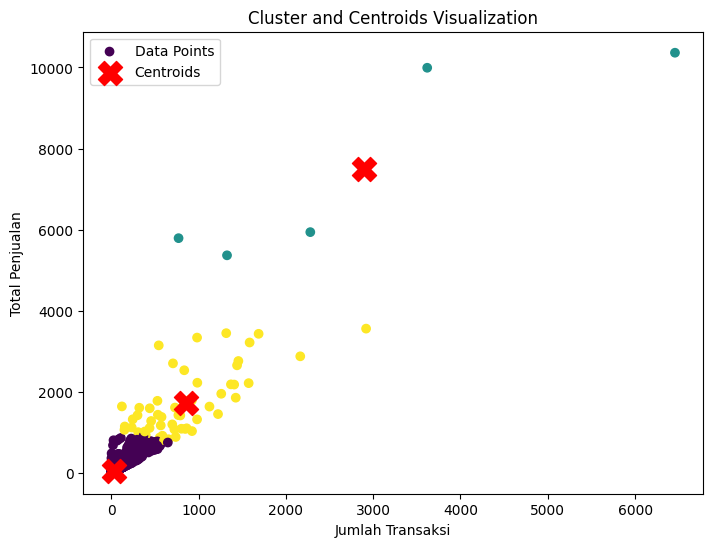

In [155]:
# Menampilkan pusat cluster (centroid)
centroids = km.cluster_centers_

# Menyusun output dalam format tabel untuk kejelasan
centroids_df = pd.DataFrame(centroids, columns=['Jumlah Transaksi', 'Total Penjualan'])

# Menampilkan centroid dengan lebih informatif
print("Pusat Cluster (Centroids):\n")
print(centroids_df)

# Visualisasi posisi centroid
plt.figure(figsize=(8, 6))
plt.scatter(df['jumlah_transaksi'], df['total_penjualan'], c=y_predicted, cmap='viridis', label='Data Points')
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.title('Cluster and Centroids Visualization')
plt.legend()
plt.show()


In [156]:
km.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

Data dengan Label Cluster:
                             kode_barang  \
0  2 TANG  BLACK TEA 1 RENCENG  (ISI 10)   
1      2 TANG  MELATI 1 RENCENG (ISI 10)   
2                     AQUA 1500 ML 1 DUS   
3                           RIBUT KILOAN   
4                             7916248823   
5                             7916248830   
6                             7916248854   
7                                    870   
8                                   1602   
9                             7916248847   

                             nama_barang  jumlah_transaksi  total_penjualan  \
0  2 TANG  BLACK TEA 1 RENCENG  (ISI 10)                 1                1   
1      2 TANG  MELATI 1 RENCENG (ISI 10)                 1                1   
2                     AQUA 1500 ML 1 DUS                10               11   
3                           RIBUT KILOAN                77               83   
4                        MINYAK TAWON FF                 8                9   
5             

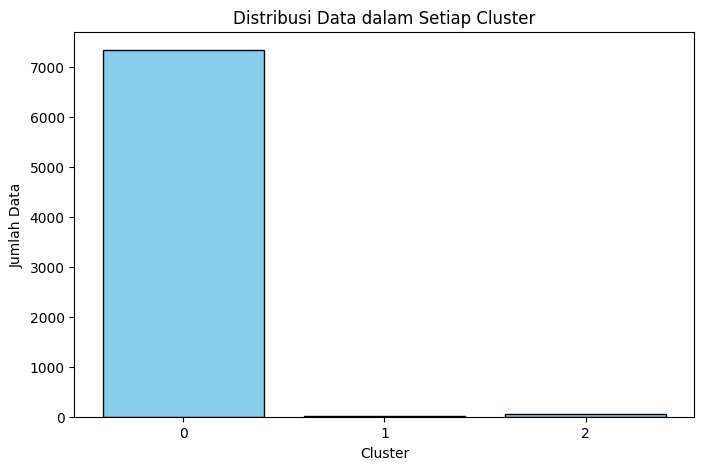

In [157]:
# Mendapatkan label cluster untuk setiap data poin
labels = km.labels_

# Menambahkan label cluster ke DataFrame asli
df['Cluster'] = labels

# Menampilkan 10 data pertama beserta label clusternya
print("Data dengan Label Cluster:")
print(df.head(10))

# Menghitung distribusi data dalam setiap cluster
cluster_distribution = df['Cluster'].value_counts().sort_index()

print("\nDistribusi Data dalam Setiap Cluster:")
for cluster, count in cluster_distribution.items():
    print(f"Cluster {cluster}: {count} data points")

# Visualisasi distribusi data dalam setiap cluster
plt.figure(figsize=(8, 5))
plt.bar(cluster_distribution.index, cluster_distribution.values, color='skyblue', edgecolor='black')
plt.title('Distribusi Data dalam Setiap Cluster')
plt.xlabel('Cluster')
plt.ylabel('Jumlah Data')
plt.xticks(ticks=cluster_distribution.index)
plt.show()


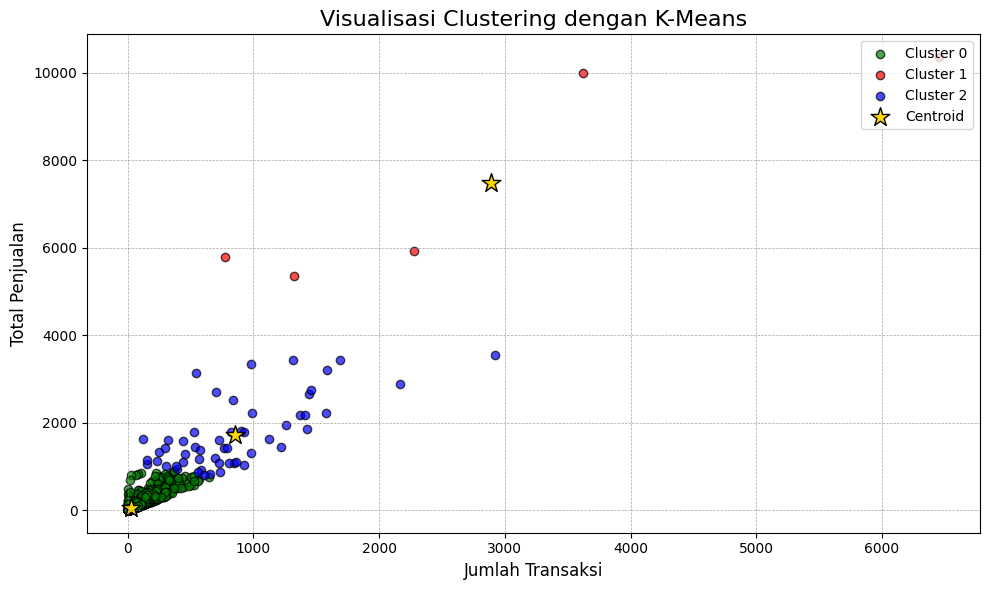

In [158]:
# Pisahkan data berdasarkan cluster
df_cluster_0 = df[df['Cluster'] == 0]
df_cluster_1 = df[df['Cluster'] == 1]
df_cluster_2 = df[df['Cluster'] == 2]

# Visualisasi data dalam setiap cluster
plt.figure(figsize=(10, 6))
plt.scatter(
    df_cluster_0['jumlah_transaksi'], df_cluster_0['total_penjualan'],
    color='green', label='Cluster 0', alpha=0.7, edgecolor='black'
)
plt.scatter(
    df_cluster_1['jumlah_transaksi'], df_cluster_1['total_penjualan'],
    color='red', label='Cluster 1', alpha=0.7, edgecolor='black'
)
plt.scatter(
    df_cluster_2['jumlah_transaksi'], df_cluster_2['total_penjualan'],
    color='blue', label='Cluster 2', alpha=0.7, edgecolor='black'
)

# Plotkan centroid
plt.scatter(
    km.cluster_centers_[:, 0], km.cluster_centers_[:, 1],
    color='gold', marker='*', label='Centroid', s=200, edgecolor='black'
)

# Menambahkan judul dan label
plt.title('Visualisasi Clustering dengan K-Means', fontsize=16)
plt.xlabel('Jumlah Transaksi', fontsize=12)
plt.ylabel('Total Penjualan', fontsize=12)

# Menambahkan legenda
plt.legend(loc='upper right', fontsize=10)
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

# Menampilkan grafik
plt.tight_layout()
plt.show()


In [159]:
k_rng = range(1,10)
sse = []

for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(df[['jumlah_transaksi','total_penjualan']])
    sse.append(km.inertia_)

In [160]:
sse

[674189825.450495,
 301479209.1997648,
 168557156.7904541,
 96738500.44480427,
 70308201.53102434,
 46908376.05454082,
 35005810.2878792,
 29666947.06524604,
 29780125.35353305]

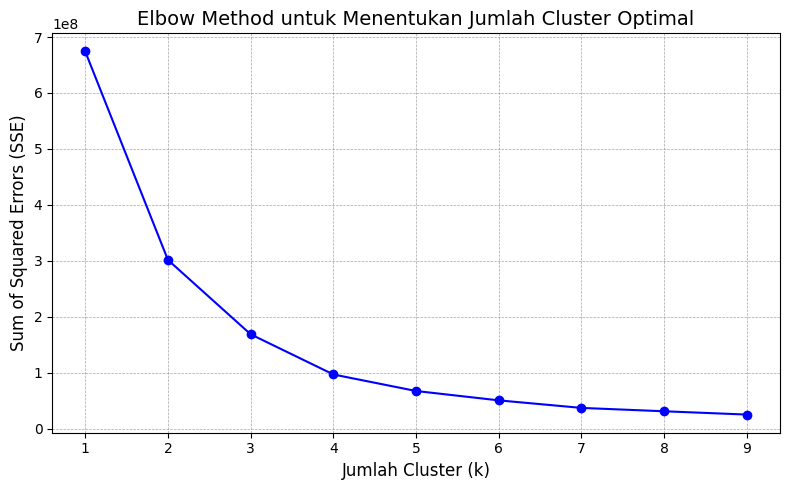

In [161]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Inisialisasi rentang jumlah cluster
k_range = range(1, 10)
sse = []  # List untuk menyimpan nilai SSE

# Iterasi untuk menghitung SSE pada tiap nilai k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)  # Tambahkan random_state untuk hasil konsisten
    kmeans.fit(df[['jumlah_transaksi', 'total_penjualan']])  # Fitting data
    sse.append(kmeans.inertia_)  # Simpan nilai inertia (SSE)

# Visualisasi SSE vs Jumlah Cluster
plt.figure(figsize=(8, 5))
plt.plot(k_range, sse, marker='o', linestyle='-', color='blue')

# Menambahkan detail grafik
plt.title('Elbow Method untuk Menentukan Jumlah Cluster Optimal', fontsize=14)
plt.xlabel('Jumlah Cluster (k)', fontsize=12)
plt.ylabel('Sum of Squared Errors (SSE)', fontsize=12)
plt.xticks(k_range)  # Pastikan semua nilai k ditampilkan di sumbu X
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

# Menampilkan grafik
plt.tight_layout()
plt.show()


In [162]:
# Menampilkan hasil SSE untuk setiap jumlah cluster
for k, error in zip(k_range, sse):
    print(f"Jumlah Cluster (k): {k}, SSE: {error:.2f}")


Jumlah Cluster (k): 1, SSE: 674189825.45
Jumlah Cluster (k): 2, SSE: 301479209.20
Jumlah Cluster (k): 3, SSE: 168572461.02
Jumlah Cluster (k): 4, SSE: 96738500.44
Jumlah Cluster (k): 5, SSE: 67170210.62
Jumlah Cluster (k): 6, SSE: 50442125.04
Jumlah Cluster (k): 7, SSE: 36962698.34
Jumlah Cluster (k): 8, SSE: 30930200.42
Jumlah Cluster (k): 9, SSE: 25047033.45


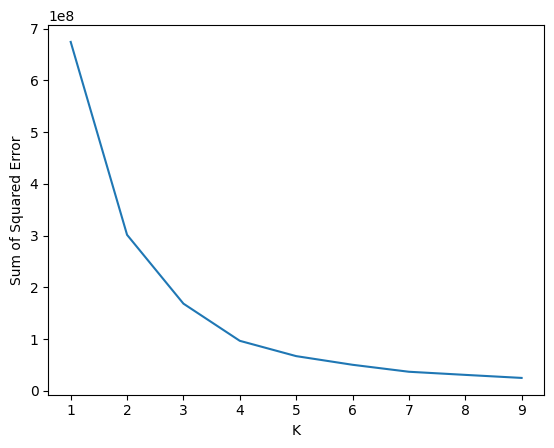

In [163]:
plt.xlabel('K')
plt.ylabel('Sum of Squared Error')
plt.plot(k_rng, sse)

# **Evaluasi Data**

In [164]:
# Seleksi kolom fitur yang relevan
selected_cols = ["jumlah_transaksi", "total_penjualan"]
cluster_data = df[selected_cols]  # Mengambil kolom yang akan digunakan untuk clustering

# Inisialisasi model K-Means dengan parameter yang dioptimalkan
kmeans_sel = KMeans(
    init='k-means++',        # Metode pengaturan awal centroid yang lebih optimal
    n_clusters=3,            # Jumlah cluster yang telah ditentukan
    n_init=100,              # Jumlah inisialisasi ulang untuk mendapatkan hasil terbaik
    random_state=42          # Random state untuk hasil yang konsisten
)

# Fitting model K-Means ke data cluster yang dipilih
kmeans_sel.fit(cluster_data)

# Menambahkan label cluster ke dataset
cluster_data['Cluster'] = kmeans_sel.labels_

# Menampilkan beberapa baris pertama dari dataset yang sudah diberi label cluster
print(cluster_data.head())


   jumlah_transaksi  total_penjualan  Cluster
0                 1                1        0
1                 1                1        0
2                10               11        0
3                77               83        0
4                 8                9        0


<ipython-input-164-12b6e6906a19>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_data['Cluster'] = kmeans_sel.labels_


In [165]:
# Mengelompokkan data berdasarkan cluster dan menghitung rata-rata untuk setiap fitur
grouped_km = cluster_data.groupby('Cluster').mean().round(1)

# Menampilkan hasil pengelompokan
print("Rata-rata fitur dalam setiap cluster:")
print(grouped_km)


Rata-rata fitur dalam setiap cluster:
         jumlah_transaksi  total_penjualan
Cluster                                   
0                    29.7             41.7
1                  2890.6           7489.0
2                   858.4           1744.4


In [166]:
from sklearn.metrics import confusion_matrix,classification_report
print(confusion_matrix(df['cluster'],km.labels_))

[[6686    0    0    0  592    0    0   66    0]
 [   0    0    0    1    0    3    0    0    1]
 [   0    2   21    0    0    0    9   22    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]]


In [167]:
from sklearn.metrics import confusion_matrix, classification_report

# Pastikan Anda memiliki label referensi (misalnya: df['true_label'])
if 'true_label' in df.columns:  # Hanya jika true_label tersedia
    print("Confusion Matrix:")
    print(confusion_matrix(df['true_label'], km.labels_))
    print("\nClassification Report:")
    print(classification_report(df['true_label'], km.labels_))
else:
    print("Label referensi (true_label) tidak ditemukan dalam dataset. Evaluasi clustering hanya berdasarkan cluster.")


Label referensi (true_label) tidak ditemukan dalam dataset. Evaluasi clustering hanya berdasarkan cluster.


In [168]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Menghitung skor evaluasi clustering
sil_score = silhouette_score(df[['jumlah_transaksi', 'total_penjualan']], km.labels_)
ch_score = calinski_harabasz_score(df[['jumlah_transaksi', 'total_penjualan']], km.labels_)

print(f"Silhouette Score: {sil_score:.3f}")
print(f"Calinski-Harabasz Index: {ch_score:.3f}")


Silhouette Score: 0.810
Calinski-Harabasz Index: 20000.196


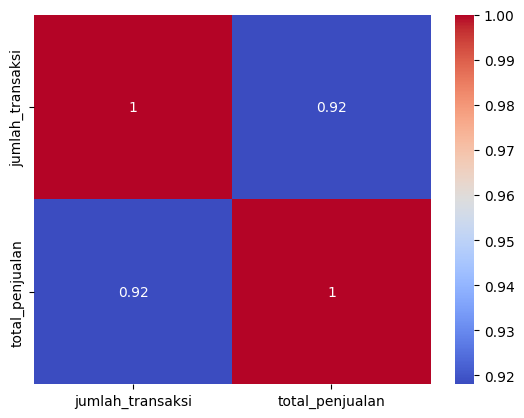

In [169]:
import seaborn as sns

# Menghitung korelasi antar fitur
correlation_matrix = df[['jumlah_transaksi', 'total_penjualan']].corr()

# Plot heatmap untuk korelasi
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()


In [170]:
from sklearn.metrics import classification_report

# Menampilkan classification report untuk membandingkan label asli dengan label hasil clustering
print(classification_report(df['cluster'], km.labels_))


              precision    recall  f1-score   support

           0       1.00      0.91      0.95      7344
           1       0.00      0.00      0.00         5
           2       1.00      0.39      0.56        54
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0

    accuracy                           0.91      7403
   macro avg       0.22      0.14      0.17      7403
weighted avg       1.00      0.91      0.95      7403



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [171]:
df.sort_values(by=['cluster'])

,kode_barang,nama_barang,jumlah_transaksi,total_penjualan,rata_rata,total_penjualan_cluster,jumlah_transaksi_cluster,cluster,Cluster
0,2 TANG BLACK TEA 1 RENCENG (ISI 10),2 TANG BLACK TEA 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000,0,0
4919,8998866108317,EMERON HJB ANTI DANDRUF RENCENG,10,10,1.0000,0.000869,0.001394,0,0
4918,8998866108300,EMERON HIJAB ANTI DANDRUFF 170ML,6,6,1.0000,0.000483,0.000774,0,0
4917,8998866108287,LOVELY COMPACT POWDER NO.03,5,5,1.0000,0.000386,0.000620,0,0
4916,8998866108270,LOVELY COMPACT POWDER NO.02,3,3,1.0000,0.000193,0.000310,0,0
4915,8998866108263,LOVELY COMPACT POWDER NO.01,3,3,1.0000,0.000193,0.000310,0,0
4914,8998866108232,LOVELY LOOSE POWDER NO.02,1,1,1.0000,0.000000,0.000000,0,0
4913,8998866108225,LOVELY LOOSE POWDER NO.01,1,1,1.0000,0.000000,0.000000,0,0
4912,8998866108126,POSH HIJAB WINTER MAGIC 150ML,15,15,1.0000,0.001351,0.002169,0,0
4911,8998866108119,POSH HIJAB PURPLE WISH 150ML,19,19,1.0000,0.001737,0.002788,0,0


In [172]:
import pandas as pd

# Menetapkan opsi untuk menampilkan semua baris dalam DataFrame
pd.set_option('display.max_rows', df.shape[0] + 1)

# Mengurutkan DataFrame berdasarkan kolom 'cluster'
df_sorted = df.sort_values(by=['cluster'])

# Menampilkan DataFrame yang sudah diurutkan
df_sorted


,kode_barang,nama_barang,jumlah_transaksi,total_penjualan,rata_rata,total_penjualan_cluster,jumlah_transaksi_cluster,cluster,Cluster
0,2 TANG BLACK TEA 1 RENCENG (ISI 10),2 TANG BLACK TEA 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000,0,0
4919,8998866108317,EMERON HJB ANTI DANDRUF RENCENG,10,10,1.0000,0.000869,0.001394,0,0
4918,8998866108300,EMERON HIJAB ANTI DANDRUFF 170ML,6,6,1.0000,0.000483,0.000774,0,0
4917,8998866108287,LOVELY COMPACT POWDER NO.03,5,5,1.0000,0.000386,0.000620,0,0
4916,8998866108270,LOVELY COMPACT POWDER NO.02,3,3,1.0000,0.000193,0.000310,0,0
4915,8998866108263,LOVELY COMPACT POWDER NO.01,3,3,1.0000,0.000193,0.000310,0,0
4914,8998866108232,LOVELY LOOSE POWDER NO.02,1,1,1.0000,0.000000,0.000000,0,0
4913,8998866108225,LOVELY LOOSE POWDER NO.01,1,1,1.0000,0.000000,0.000000,0,0
4912,8998866108126,POSH HIJAB WINTER MAGIC 150ML,15,15,1.0000,0.001351,0.002169,0,0
4911,8998866108119,POSH HIJAB PURPLE WISH 150ML,19,19,1.0000,0.001737,0.002788,0,0


In [173]:
df.head()

,kode_barang,nama_barang,jumlah_transaksi,total_penjualan,rata_rata,total_penjualan_cluster,jumlah_transaksi_cluster,cluster,Cluster
0,2 TANG BLACK TEA 1 RENCENG (ISI 10),2 TANG BLACK TEA 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000,0,0
1,2 TANG MELATI 1 RENCENG (ISI 10),2 TANG MELATI 1 RENCENG (ISI 10),1,1,1.0000,0.000000,0.000000,0,0
2,AQUA 1500 ML 1 DUS,AQUA 1500 ML 1 DUS,10,11,1.1000,0.000965,0.001394,0,0
3,RIBUT KILOAN,RIBUT KILOAN,77,83,1.0779,0.007914,0.011772,0,0
4,7916248823,MINYAK TAWON FF,8,9,1.1250,0.000772,0.001084,0,0


In [174]:
df.to_csv('datasets-jadi.csv', index=False)

# **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)**

In [175]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [176]:
# Menggunakan StandardScaler untuk melakukan normalisasi data (karena DBSCAN sensitif terhadap skala data)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_cleaned[['jumlah_transaksi', 'total_penjualan']])


In [177]:
# Inisialisasi DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # eps menentukan jarak maksimum antar titik untuk membentuk sebuah cluster
dbscan_labels = dbscan.fit_predict(scaled_data)

In [178]:
# Menambahkan hasil clustering DBSCAN ke dalam DataFrame
df_cleaned['dbscan_cluster'] = dbscan_labels


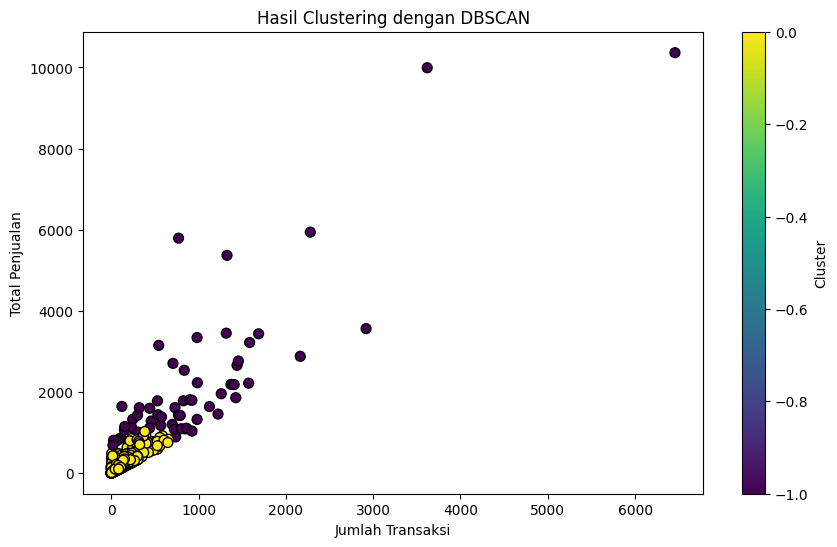

In [179]:
# Visualisasi hasil DBSCAN
plt.figure(figsize=(10, 6))
plt.scatter(df_cleaned['jumlah_transaksi'], df_cleaned['total_penjualan'], c=df_cleaned['dbscan_cluster'], cmap='viridis', marker='o', edgecolor='k', s=50)
plt.title('Hasil Clustering dengan DBSCAN')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.show()

In [180]:
# Menampilkan jumlah cluster yang ditemukan oleh DBSCAN
num_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
print(f'Jumlah cluster yang ditemukan: {num_clusters}')
print(f'Jumlah noise (outliers): {list(dbscan_labels).count(-1)}')

Jumlah cluster yang ditemukan: 1
Jumlah noise (outliers): 58


# **Agglomerative Clustering**

In [181]:
from sklearn.cluster import AgglomerativeClustering

# Inisialisasi AgglomerativeClustering
agg_clust = AgglomerativeClustering(n_clusters=3)  # Tentukan jumlah cluster

# Pastikan scaled_data memiliki jumlah baris yang sama dengan df
scaled_data = scaler.fit_transform(df[['jumlah_transaksi', 'total_penjualan']])

# Melakukan clustering pada data yang sudah di-scale
agg_labels = agg_clust.fit_predict(scaled_data)

# Menambahkan hasil clustering Agglomerative ke dalam DataFrame
df['agg_cluster'] = agg_labels

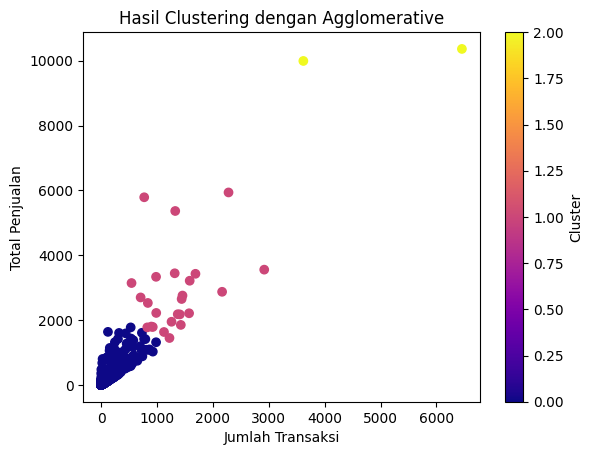

In [182]:
# Visualisasi hasil Agglomerative Clustering
plt.scatter(df['jumlah_transaksi'], df['total_penjualan'], c=df['agg_cluster'], cmap='plasma')
plt.title('Hasil Clustering dengan Agglomerative')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.show()


In [183]:
# Menampilkan rata-rata dari masing-masing cluster untuk evaluasi
agg_cluster_summary = df.groupby('agg_cluster')[['jumlah_transaksi', 'total_penjualan']].mean()
print(agg_cluster_summary)

             jumlah_transaksi  total_penjualan
agg_cluster                                   
0                   31.846665        46.629745
1                 1321.600000      2870.200000
2                 5038.000000     10177.500000


# **Membandingkan Hasil Clustering KMeans, DBSCAN, dan Agglomerative**

Menghitung Statistik Deskriptif Setiap Cluster

In [184]:
# Menghitung statistik deskriptif untuk masing-masing cluster
cluster_summary = df.groupby('agg_cluster')[['jumlah_transaksi', 'total_penjualan']].describe()
print(cluster_summary)


            jumlah_transaksi                                            \
                       count         mean          std     min     25%   
agg_cluster                                                              
0                     7376.0    31.846665    64.555882     1.0     4.0   
1                       25.0  1321.600000   535.612733   544.0   924.0   
2                        2.0  5038.000000  2006.769045  3619.0  4328.5   

                                    total_penjualan                \
                50%     75%     max           count          mean   
agg_cluster                                                         
0              11.0    31.0   983.0          7376.0     46.629745   
1            1317.0  1456.0  2919.0            25.0   2870.200000   
2            5038.0  5747.5  6457.0             2.0  10177.500000   

                                                                        
                     std     min       25%      50%       75%      

In [185]:
# Memeriksa dan menangani nilai yang hilang
df_cleaned = df.dropna()

In [186]:
# Menggunakan StandardScaler untuk melakukan normalisasi data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_cleaned[['jumlah_transaksi', 'total_penjualan']])

Silhouette Score

In [187]:
from sklearn.metrics import silhouette_score

# KMeans Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df_cleaned['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
df_cleaned['dbscan_cluster'] = dbscan.fit_predict(scaled_data)

# Agglomerative Clustering
agg_clust = AgglomerativeClustering(n_clusters=3)
df_cleaned['agg_cluster'] = agg_clust.fit_predict(scaled_data)


<ipython-input-187-82ac37edfd01>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['kmeans_cluster'] = kmeans.fit_predict(scaled_data)
<ipython-input-187-82ac37edfd01>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['dbscan_cluster'] = dbscan.fit_predict(scaled_data)
<ipython-input-187-82ac37edfd01>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation

In [188]:
# Menghitung Silhouette Score untuk KMeans
kmeans_silhouette = silhouette_score(scaled_data, df_cleaned['kmeans_cluster'])
print(f'Silhouette Score untuk KMeans: {kmeans_silhouette:.3f}')

# Menghitung Silhouette Score untuk DBSCAN
# DBSCAN dapat menghasilkan label -1 untuk noise, jadi kita perlu memisahkan noise dari perhitungan
if len(set(df_cleaned['dbscan_cluster'])) > 1:  # Pastikan ada lebih dari satu cluster
    dbscan_silhouette = silhouette_score(scaled_data, df_cleaned['dbscan_cluster'])
else:
    dbscan_silhouette = -1  # Jika hanya ada satu cluster (atau noise), set score ke -1
print(f'Silhouette Score untuk DBSCAN: {dbscan_silhouette:.3f}')

# Menghitung Silhouette Score untuk Agglomerative Clustering
agg_silhouette = silhouette_score(scaled_data, df_cleaned['agg_cluster'])
print(f'Silhouette Score untuk Agglomerative Clustering: {agg_silhouette:.3f}')

Silhouette Score untuk KMeans: 0.953
Silhouette Score untuk DBSCAN: 0.957
Silhouette Score untuk Agglomerative Clustering: 0.967


Davies-Bouldin Index

In [189]:
from sklearn.metrics import davies_bouldin_score

# KMeans Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df_cleaned['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
df_cleaned['dbscan_cluster'] = dbscan.fit_predict(scaled_data)

# Agglomerative Clustering
agg_clust = AgglomerativeClustering(n_clusters=3)
df_cleaned['agg_cluster'] = agg_clust.fit_predict(scaled_data)


<ipython-input-189-ebbd64475e28>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['kmeans_cluster'] = kmeans.fit_predict(scaled_data)
<ipython-input-189-ebbd64475e28>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['dbscan_cluster'] = dbscan.fit_predict(scaled_data)
<ipython-input-189-ebbd64475e28>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation

In [190]:
# Menghitung Davies-Bouldin Index untuk KMeans
kmeans_dbi = davies_bouldin_score(scaled_data, df_cleaned['kmeans_cluster'])
print(f'Davies-Bouldin Index untuk KMeans: {kmeans_dbi:.3f}')

# Menghitung Davies-Bouldin Index untuk DBSCAN
# DBSCAN dapat menghasilkan label -1 untuk noise, jadi kita perlu memisahkan noise dari perhitungan
if len(set(df_cleaned['dbscan_cluster'])) > 1:  # Pastikan ada lebih dari satu cluster
    dbscan_dbi = davies_bouldin_score(scaled_data, df_cleaned['dbscan_cluster'])
else:
    dbscan_dbi = float('inf')  # Jika hanya ada satu cluster (atau noise), set score ke infinity
print(f'Davies-Bouldin Index untuk DBSCAN: {dbscan_dbi:.3f}')

# Menghitung Davies-Bouldin Index untuk Agglomerative Clustering
agg_dbi = davies_bouldin_score(scaled_data, df_cleaned['agg_cluster'])
print(f'Davies-Bouldin Index untuk Agglomerative Clustering: {agg_dbi:.3f}')

Davies-Bouldin Index untuk KMeans: 0.591
Davies-Bouldin Index untuk DBSCAN: 0.655
Davies-Bouldin Index untuk Agglomerative Clustering: 0.394


Inertia (SSE) - Khusus untuk KMeans

In [191]:
# Menghitung Inertia (SSE) untuk KMeans
kmeans_inertia = km.inertia_
print(f'Inertia (SSE) untuk KMeans: {kmeans_inertia}')


Inertia (SSE) untuk KMeans: 29780125.35353305


Visualisasi dan Analisis Hubungan Antar Cluster

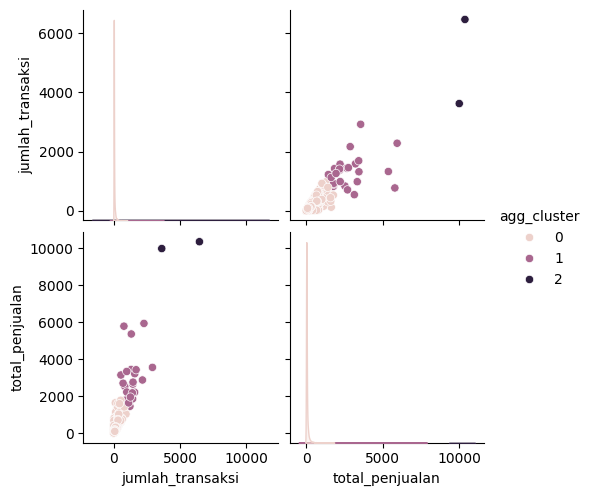

In [192]:
import seaborn as sns

# Visualisasi distribusi data pada setiap cluster
sns.pairplot(df, hue='agg_cluster', vars=['jumlah_transaksi', 'total_penjualan'])
plt.show()


Jumlah Cluster yang Ditemukan

In [193]:
# KMeans
kmeans_clusters = len(set(df_cleaned['kmeans_cluster']))  # Menghitung jumlah cluster KMeans
print(f'Jumlah cluster yang ditemukan oleh KMeans: {kmeans_clusters}')

# DBSCAN
dbscan_clusters = len(set(df_cleaned['dbscan_cluster'])) - (1 if -1 in df_cleaned['dbscan_cluster'] else 0)  # Menghitung jumlah cluster DBSCAN, mengabaikan noise
print(f'Jumlah cluster yang ditemukan oleh DBSCAN: {dbscan_clusters}')

# Agglomerative Clustering
agg_clusters = len(set(df_cleaned['agg_cluster']))  # Menghitung jumlah cluster Agglomerative
print(f'Jumlah cluster yang ditemukan oleh Agglomerative Clustering: {agg_clusters}')

Jumlah cluster yang ditemukan oleh KMeans: 3
Jumlah cluster yang ditemukan oleh DBSCAN: 2
Jumlah cluster yang ditemukan oleh Agglomerative Clustering: 3


Visualisasi Hasil Clustering

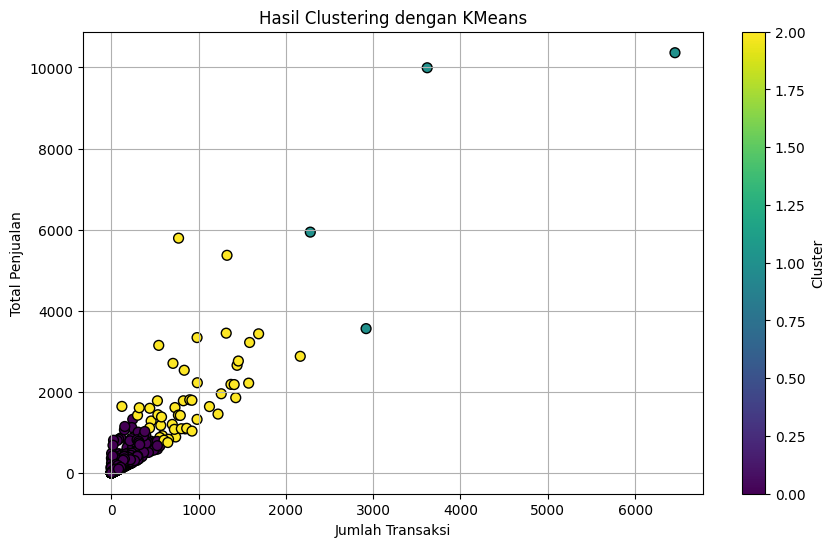

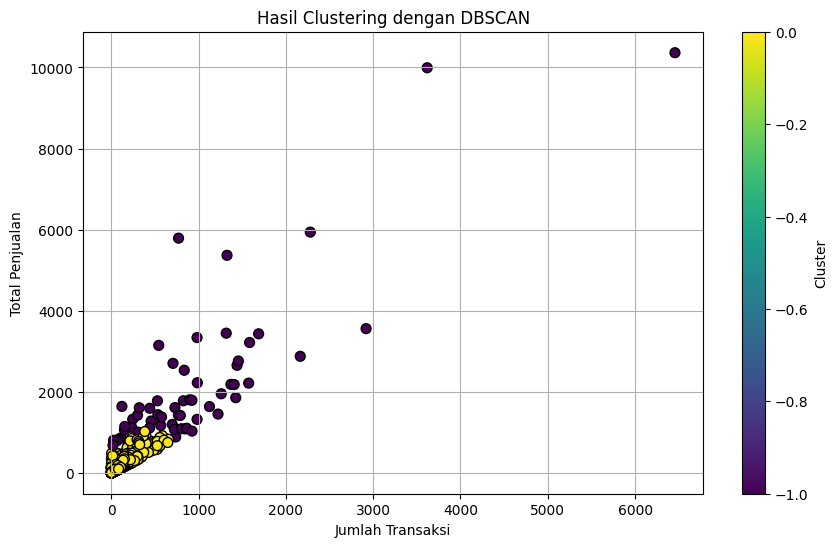

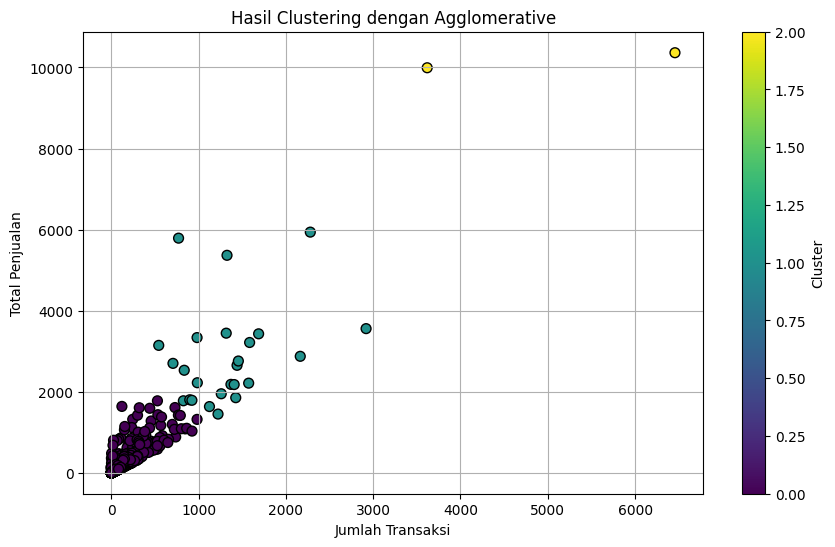

In [194]:
import matplotlib.pyplot as plt

# Visualisasi KMeans
plt.figure(figsize=(10, 6))
plt.scatter(df_cleaned['jumlah_transaksi'], df_cleaned['total_penjualan'], c=df_cleaned['kmeans_cluster'], cmap='viridis', marker='o', edgecolor='k', s=50)
plt.title('Hasil Clustering dengan KMeans')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

# Visualisasi DBSCAN
plt.figure(figsize=(10, 6))
plt.scatter(df_cleaned['jumlah_transaksi'], df_cleaned['total_penjualan'], c=df_cleaned['dbscan_cluster'], cmap='viridis', marker='o', edgecolor='k', s=50)
plt.title('Hasil Clustering dengan DBSCAN')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

# Visualisasi Agglomerative Clustering
plt.figure(figsize=(10, 6))
plt.scatter(df_cleaned['jumlah_transaksi'], df_cleaned['total_penjualan'], c=df_cleaned['agg_cluster'], cmap='viridis', marker='o', edgecolor='k', s=50)
plt.title('Hasil Clustering dengan Agglomerative')
plt.xlabel('Jumlah Transaksi')
plt.ylabel('Total Penjualan')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()